# Final Report: Density distribution of bike trails in Germany compared to Austria

This data analysis uses open data from [Mobilithek](https://mobilithek.info/offers/-3233407406425016501) which is the dataset for trails in Hamburg, open data from [Muenchen](https://opendata.muenchen.de/dataset/7ad3bc6c-4c1a-4a63-9cb2-0d613f5b69fa/resource/edcb7ad4-7ceb-42a5-b1ef-4762929d154d/download/shape_radwege_t2_opendata.zip) which is the dataset for trails in Muenchen, and open data of the [European Union](https://data.europa.eu/data/datasets/6f5247c1-53f1-4536-ab1c-9f684a6703bb?locale=de) to render a map of the bike trails.

The question that interests me: Who have the higher density distribution of bike trail, Germany or Austria?

## Install dependencies
Initially, install all required dependencies. The specific version of SQLAlchemy is needed because SQLAlchemy 2.0 does not work with pandas yet. nbformat allows the use of the "notebook" formatter for the plot, others can not be rendered to HTML.

In [1]:
%pip install pandas
%pip install geopandas
%pip install matplotlib
%pip install contextily
%pip install plotly
%pip install 'SQLAlchemy==1.4.46'
%pip install nbformat
%pip install ipysheet
%pip install scipy

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


## Load data
Create a pandas or geopandas dataframe using the local sqlite files.

In [2]:
import pandas as pd
import geopandas as gpd

hamburg = gpd.read_file('project/data/hamburg.sqlite', driver='SQLite', spatialite=True, layer='hamburg')

muenchen = gpd.read_file('project/data/muenchen.sqlite', driver='SQLite', spatialite=True, layer='muenchen')

tirol = pd.read_sql_table('tirol', 'sqlite:///project/data/tirol.sqlite')

## Density distributions of bike trails in Germany and Austria ?
There are three datasets one of all trails from Hamburg, one of all trails from Muenchen and on contains all trails from Tirol. 
To answer our initial question, we use plotly and contextily to draw a scatterplot of all bike trails within our datasets, overlaying it on a map from OpenStreetMap.

The bike trails will be colored based on the `name`, allowing us to see what different bike trails are there.

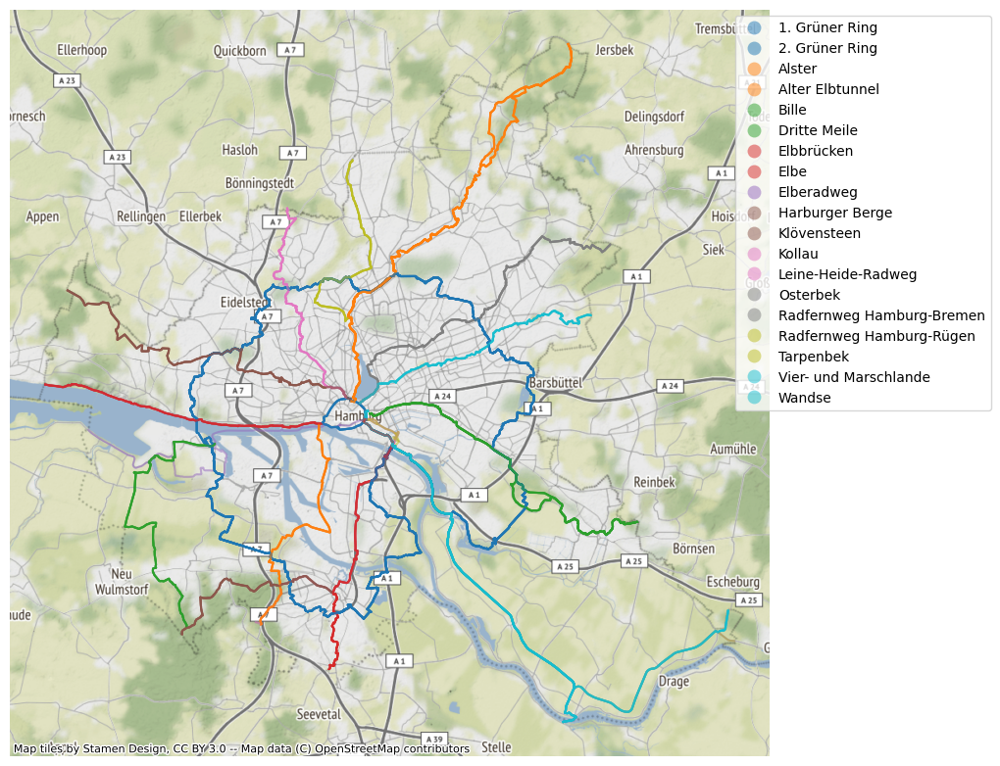

In [3]:
import contextily as cx

hamburg_gdf_wm = hamburg.to_crs(epsg=3857)
ax = hamburg_gdf_wm.plot(column='routenname', figsize=(10, 10), alpha=0.5,legend=True)
leg = ax.get_legend()
leg.set_bbox_to_anchor((1.3, 1.0))
cx.add_basemap(ax)
ax.set_axis_off()

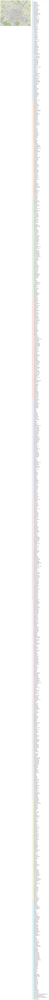

In [4]:
import contextily as cx

muenchen_gdf_wm = muenchen.to_crs(epsg=3857)
ax = muenchen_gdf_wm.plot(column='strassenna',figsize=(10, 10), alpha=0.5, legend=True)
leg = ax.get_legend()
leg.set_bbox_to_anchor((1.6, 1.0))
cx.add_basemap(ax)
ax.set_axis_off()

In [5]:
import plotly.io as pio
import plotly.express as px

pio.renderers.default = "notebook"

fig = px.scatter_mapbox(tirol, 
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="name", 
                        hover_data=["name"],
                        color="name",
                        zoom=5, 
                        height=800,
                        width=1200)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


## Comparison of Facts

In [6]:
from ipysheet import sheet, cell
import math 

total_trails_hamburg = hamburg['routenname'].count()
total_trails_muenchen = muenchen['strassenna'].count()
total_trails_tirol = tirol['name'].count()

sheet_test = sheet(column_headers=['Name of dataset:','Number of trails:'])
cell10 = cell(0, 0, 'Hamburg')
cell20 = cell(1, 0, 'Muenchen')
cell30 = cell(2, 0, 'Tirol')
cell11 = cell(0, 1, total_trails_hamburg)
cell21 = cell(1, 1, total_trails_muenchen)
cell31 = cell(2, 1, total_trails_tirol)

sheet_test

Sheet(cells=(Cell(column_end=0, column_start=0, row_end=0, row_start=0, type='numeric', value=352), Cell(colum…